In [29]:
import phoebe
from phoebe import u, c

import matplotlib.pyplot as plt

import os
import sys
from pathlib import Path
baseModulePath = str(Path(os.getcwd()).parents[2].absolute())
if baseModulePath not in sys.path:
	sys.path.append(baseModulePath)

import importlib
import analisis.phoebe_model.utils as gen_utils
importlib.reload(gen_utils)

logger = phoebe.logger(clevel='WARNING')

In [30]:
# b = phoebe.load("../optimizers/bundle-saves/poro-aviles-invq/after_optimizers")
b = phoebe.load("../optimizers/bundle-saves/iturbide-gaia-ztf-relative_norm/post-optimizers")

# Renaming Datasets

Getting dataset names to play nice with plotting; math latex parser errors out with `lc_gaia_g_raw` due to 2 consecutive underscores (`_g` part probably).

In [31]:
originalDatasets = [d for d in b.datasets if d != 'mesh01' and 'Ztf' not in d]
originalDatasets

['lc_iturbide_norm',
 'lc_iturbide_aviles_norm',
 'lc_gaia_g_raw',
 'lc_gaia_rp_raw',
 'lc_gaia_bp_raw']

In [32]:
# using own iturbide flux sigmas for now
fullIturbideSigmas = b.get_value(qualifier='sigmas', dataset='lc_iturbide_norm', context='dataset')
avilesIturbideFlux = b.get_value(qualifier='fluxes', dataset='lc_iturbide_aviles_norm', context='dataset')
b.add_dataset('lc', dataset='lcIturbideAviles', overwrite=True,
			  times=b.get_value(qualifier='times', dataset='lc_iturbide_aviles_norm', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_iturbide_aviles_norm', context='dataset'),
			  sigmas=fullIturbideSigmas[:len(avilesIturbideFlux)] / 2)

b.add_dataset('lc', dataset='lcIturbideFull', overwrite=True,
			  times=b.get_value(qualifier='times', dataset='lc_iturbide_norm', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_iturbide_norm', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_iturbide_norm', context='dataset'))

b.add_dataset('lc', dataset='lcGaiaG', overwrite=True, passband='Gaia:G',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_g_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_g_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_g_raw', context='dataset'))
b.add_dataset('lc', dataset='lcGaiaRP', overwrite=True, passband='Gaia:RP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_rp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_rp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_rp_raw', context='dataset'))
b.add_dataset('lc', dataset='lcGaiaBP', overwrite=True, passband='Gaia:BP',
			  times=b.get_value(qualifier='times', dataset='lc_gaia_bp_raw', context='dataset'),
			  fluxes=b.get_value(qualifier='fluxes', dataset='lc_gaia_bp_raw', context='dataset'),
			  sigmas=b.get_value(qualifier='sigmas', dataset='lc_gaia_bp_raw', context='dataset'))

<ParameterSet: 47 parameters | contexts: compute, figure, dataset, constraint>

In [33]:
gaiaDatasets = [d for d in b.datasets if 'Gaia' in d]
iturbideDatasets = ['lcIturbideAviles', 'lcIturbideFull']
ztfDatasets = ['lcZtfG', 'lcZtfR']
allDatasets = gaiaDatasets + iturbideDatasets + ztfDatasets
plotAllDatasetsGroups = [['lcIturbideAviles'], ['lcIturbideFull'], gaiaDatasets, ztfDatasets]

In [34]:
# copying pblum to new datasets
b.set_value_all(qualifier='pblum_mode', dataset=['lcIturbideAviles', 'lcIturbideFull', 'lcGaiaG'], value='component-coupled')
b.set_value_all(qualifier='pblum_mode', dataset=['lcGaiaRP', 'lcGaiaBP'], value='dataset-coupled')
b.set_value_all(qualifier='pblum_dataset', dataset=['lcGaiaRP', 'lcGaiaBP'], value='lcGaiaG')

for newDataset, originalDataset in zip(['lcIturbideAviles', 'lcIturbideFull', 'lcGaiaG'], ['lc_iturbide_aviles_norm', 'lc_iturbide_norm', 'lc_gaia_g_raw']):
	dataset_pblum = b.get_quantity(qualifier='pblum', component='primary', dataset=originalDataset, context='dataset')
	b.set_value(qualifier='pblum', component='primary', dataset=newDataset, value=dataset_pblum)

100%|██████████| 3673/3673 [09:02<00:00,  6.77it/s]


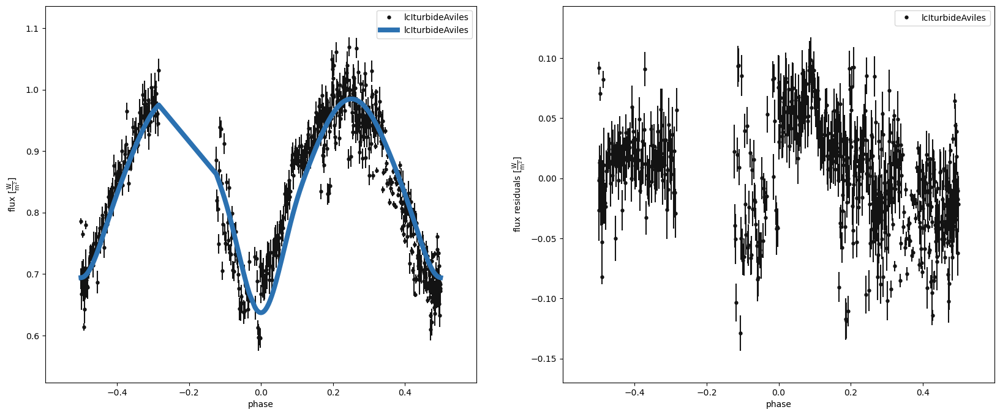

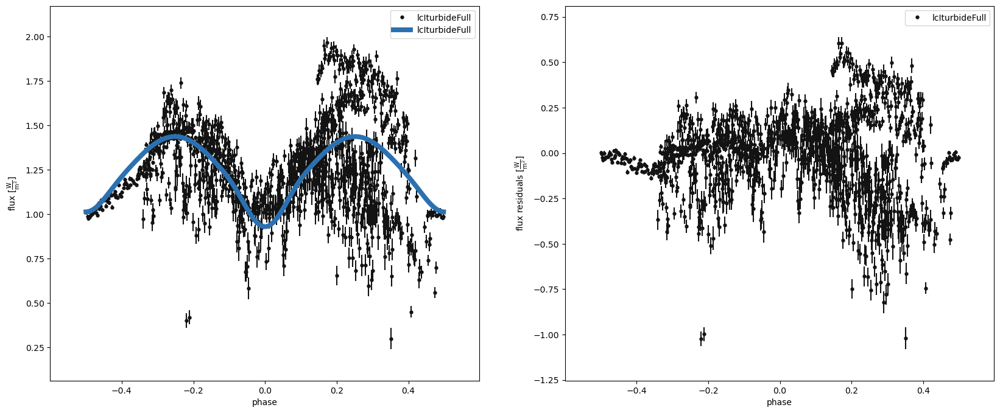

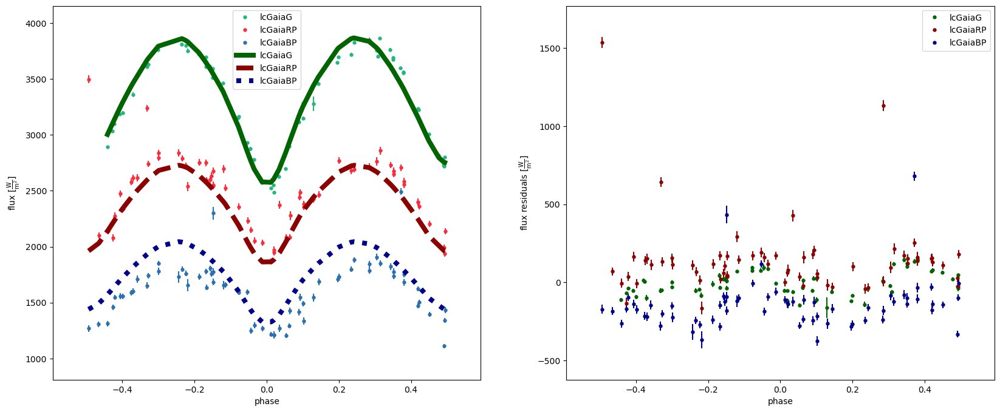

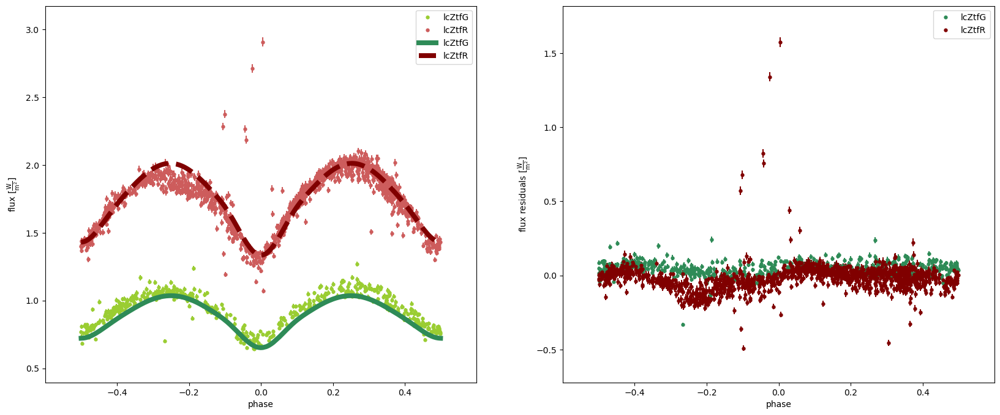

<Figure size 800x600 with 0 Axes>

GridspecLayout(children=(HTML(value='<video width="800" height="600" controls autoplay loop>\n  <source type="…

In [35]:
gen_utils.abilitateDatasets(b, allDatasets)
b.run_compute(model='after_opt', overwrite=True)
gen_utils.plotModelResidualsFigsize(b, (20, 8), plotAllDatasetsGroups, model='after_opt')
gen_utils.animateMesh(b, logger, model='after_opt')

In [39]:
for d in originalDatasets:
	b.remove_dataset(d)

# Creating Uniform Boundary Distributions

Restricting sampler parameter space; not prescribing a shape to the parameter distribution, only interested in restricting sampler space to decrease compute 
requirements.

In [40]:
print(b.get_adjustable_parameters())

ParameterSet: 56 parameters
                  distance@system: 1.0 m
                    vgamma@system: 0.0 km / s
                        Av@system: 0.0
                        Rv@system: 3.1
           teff@primary@component: 4396.901156195923 K
        syncpar@primary@component: 1.0
      gravb_bol@primary@component: 0.32
   irrad_frac_refl_bol@primary...: 0.6
           mass@primary@component: 2.266861059237414 solMass
      syncpar@secondary@component: 1.0
    gravb_bol@secondary@component: 0.32
   irrad_frac_refl_bol@seconda...: 0.6
          period@binary@component: 0.33356598071006005 d
            dpdt@binary@component: 0.0 s / yr
            per0@binary@component: 0.0 deg
          dperdt@binary@component: 0.0 deg / yr
             ecc@binary@component: 0.0
      t0_supconj@binary@component: -0.037542756559644994 d
            incl@binary@component: 66.54776777419643 deg
               q@binary@component: 1.8564781150410867
         long_an@binary@component: 0.0 deg
   abun@c

In [95]:
print(b['mass'])
print(b['requiv'])
print(b['sma'])

ParameterSet: 5 parameters
           mass@primary@component: 2.266861059237414 solMass
C        mass@secondary@component: 4.2083779463131155 solMass
                  mass@constraint: (39.478418 * ({sma@binary@component} ** 3.000000)) / ((({period@binary@component} ** 2.000000) * ((1.000000 / {q@binary@component}) + 1.000000)) * 2942.206217504419328179210424423218)
   mass@poro_porb_bounds@distr...: <distl.uniform low=1.0683323801509998 high=1.1763674300009999 unit=solMass label=mass@primary label_latex=$M_\mathrm{ primary }$>
   mass@bounds_around@distribu...: <distl.uniform_around width=0.5 value=2.266861059237414 unit=solMass frac=False>
ParameterSet: 4 parameters
C        requiv@primary@component: 1.2876971809554774 solRad
C      requiv@secondary@component: 1.6938827660968576 solRad
        requiv@primary@constraint: pot_to_requiv_contact({pot@contact_envelope@component}, {q@binary@component}, {sma@binary@component}, 1)
      requiv@secondary@constraint: pot_to_requiv_contact({pot

In [41]:
b.add_distribution({
	'teff@primary': phoebe.uniform_around(500),
	'teffratio': phoebe.uniform_around(0.1),
	'fillout_factor': phoebe.uniform_around(0.2),
	'incl@binary': phoebe.uniform_around(15),
	'q': phoebe.uniform_around(0.10),
	'mass@primary': phoebe.uniform_around(0.5)
}, distribution='bounds_around', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcIturbideAviles': phoebe.uniform_around(2)
}, distribution='bounds_pblum_aviles_iturbide', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcIturbideFull': phoebe.uniform_around(3)
}, distribution='bounds_pblum_full_iturbide', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcGaiaG': phoebe.uniform_around(5000)
}, distribution='bounds_pblum_gaia_g', overwrite_all=True)

b.add_distribution({
	'pblum@primary@lcZtfG': phoebe.uniform_around(2)
}, distribution='bounds_pblum_ztf_g', overwrite_all=True)

<ParameterSet: 1 parameters>

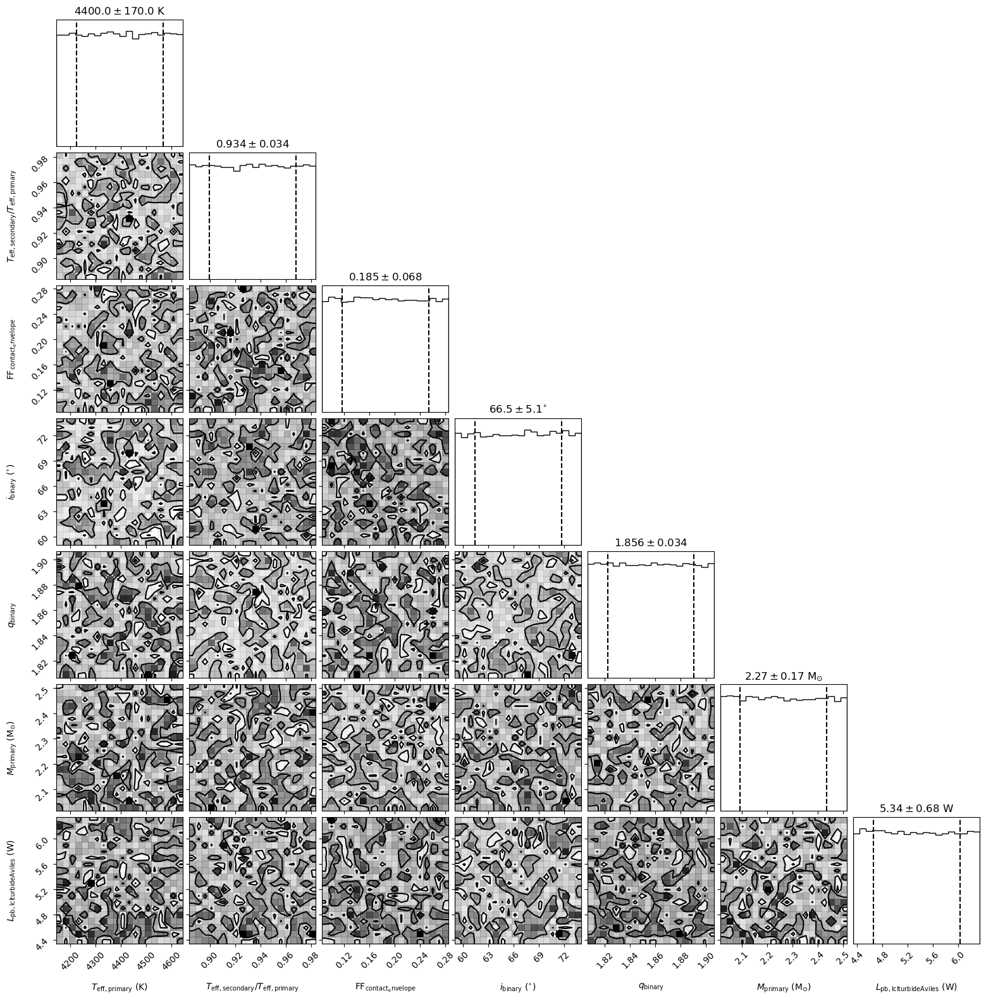

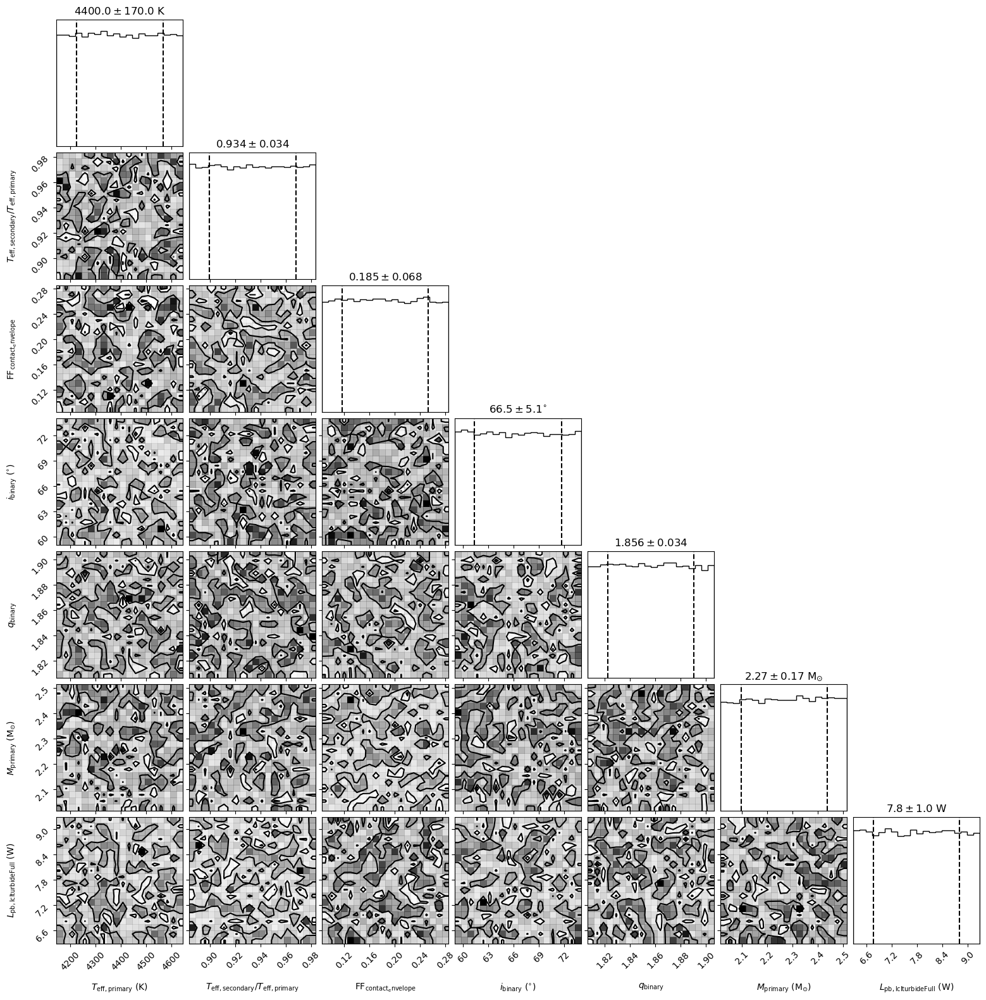

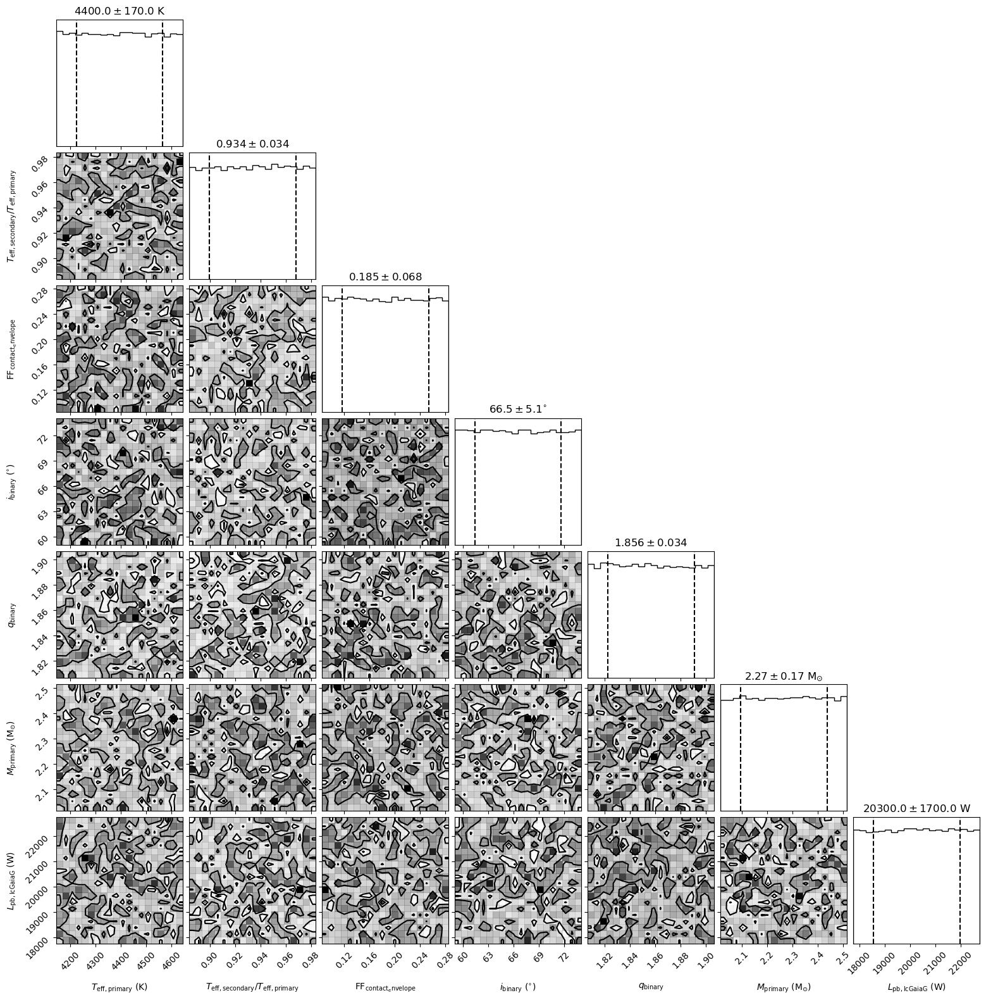

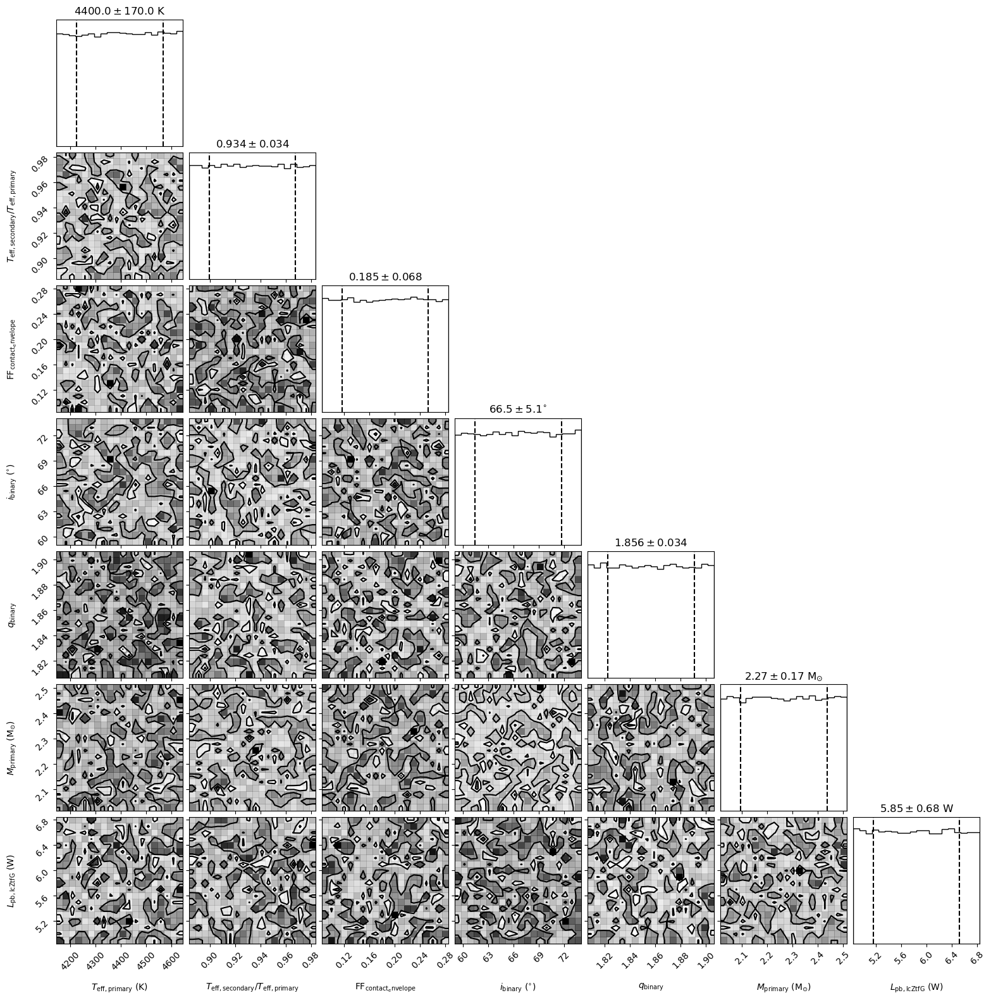

In [42]:
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_aviles_iturbide'], show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_full_iturbide'], show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_gaia_g'], show=True)
_ = b.plot_distribution_collection(['bounds_around', 'bounds_pblum_ztf_g'], show=True)

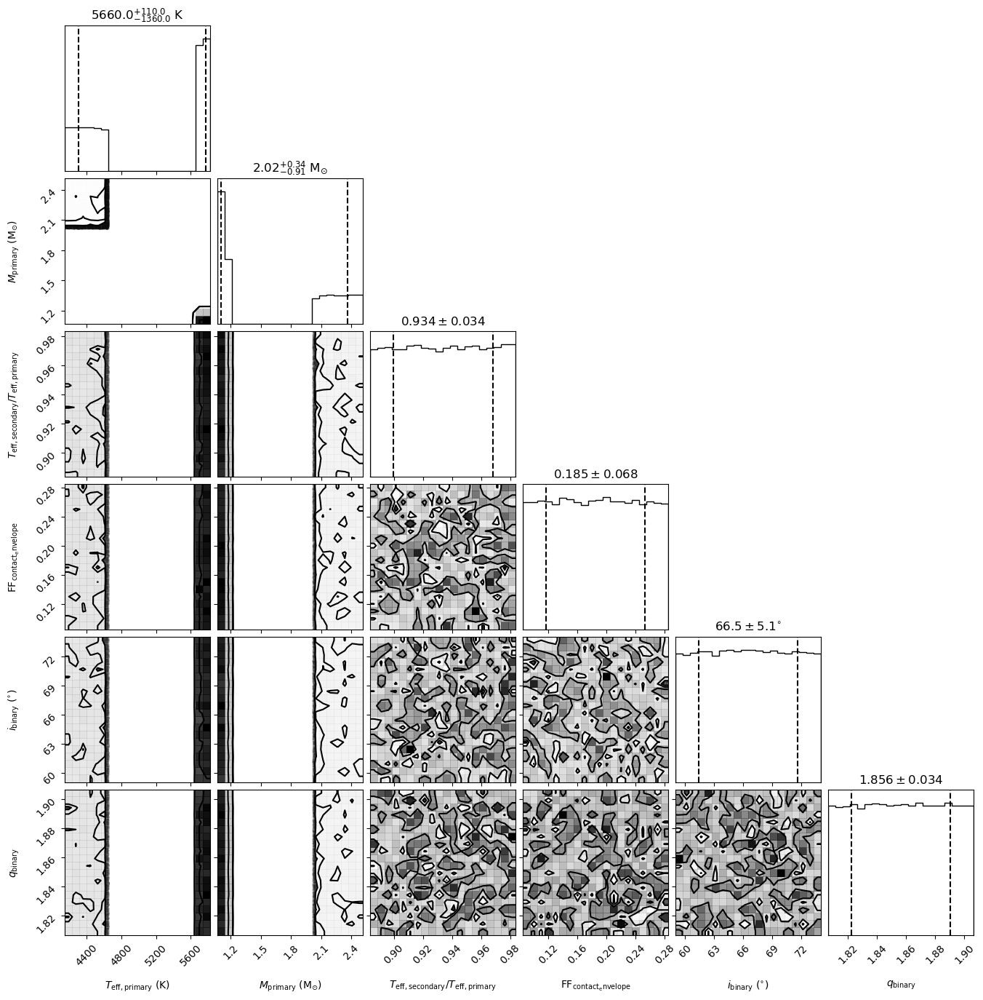

In [23]:
_ = b.plot_distribution_collection(['poro_porb_bounds', 'bounds_around'], combine='or', show=True)

# Sampled Compute Models

**SKIPPING**; whole script fails on external server when attempting to compute model with OoB parameters. Haven't found an option in documentation to ignore/skip
these errors.

In [13]:
%%script echo "skipping"
gen_utils.abilitateDatasets(b, allDatasets)
print(b['enabled'])

skipping


In [14]:
%%script echo "skipping; for compute that falls out of physical bounds, compute fails"
gen_utils.exportCompute(b, model='from_bounds_around', datasets=allDatasets, subfolder='aviles-invq', 
						sample_from='bounds_around', sample_num=50)
gen_utils.exportCompute(b, model='from_ba_pbgaia', datasets=gaiaDatasets, subfolder='aviles-invq',
						sample_from=['bounds_around', 'bounds_pblum_gaia_g'], sample_num=50)

skipping; for compute that falls out of physical bounds, compute fails


# MCMC Sampling

In [24]:
def exportSampler(b: phoebe.Bundle, sampler_solver: str, datasets: list[str], subfolder: str = None, **solver_kwargs) -> None:
	exportFolder = "external-jobs"
	if subfolder is not None:
		exportFolder = os.path.join(exportFolder, subfolder)
	os.makedirs(exportFolder, exist_ok=True)

	prevEnabledDatasets = [d for d in b.datasets if b.get_value(qualifier='enabled', dataset=d)]
	gen_utils.abilitateDatasets(b, datasets, False)
	try:
		b.add_solver('sampler.emcee', solver=sampler_solver, overwrite=True, **solver_kwargs)
		exportFilePath = os.path.join(exportFolder, f"{sampler_solver}.py")
		resultsFilePath = os.path.join("results", sampler_solver)
		fname, out_fname = b.export_solver(script_fname=exportFilePath, out_fname=resultsFilePath, solver=sampler_solver, solution=f"{sampler_solver}_solution")
		print(sampler_solver, fname, out_fname, sep=" | ")
	finally:
		gen_utils.abilitateDatasets(b, prevEnabledDatasets)

def continueSampler(b: phoebe.Bundle, prev_solver: str, continuation_label: str, datasets: list[str], subfolder: str = None, **solver_kwargs) -> None:
	exportFolder = "external-jobs"
	if subfolder is not None:
		exportFolder = os.path.join(exportFolder, subfolder)
	os.makedirs(exportFolder, exist_ok=True)

	prevEnabledDatasets = [d for d in b.datasets if b.get_value(qualifier='enabled', dataset=d)]
	gen_utils.abilitateDatasets(b, datasets)

	try:
		exportFilePath = os.path.join(exportFolder, f"{continuation_label}.py")
		resultsFilePath = os.path.join("results", f"{continuation_label}_solution")
		fname, out_fname = b.export_solver(script_fname=exportFilePath, out_fname=resultsFilePath, solver=prev_solver, solution=f"{continuation_label}_solution", 
									 continue_from=f"{prev_solver}_solution", **solver_kwargs)
		print(prev_solver, fname, out_fname, sep=" | ")
	finally:
		gen_utils.abilitateDatasets(b, prevEnabledDatasets)

def plotSamplerAcceptanceFractions(b: phoebe.Bundle, sampler_solution: str) -> None:
	nwalkers = b.get_value(qualifier='nwalkers', solution=sampler_solution)

	plt.figure(figsize=(15, 4))
	walkersIds = list(map(lambda wid: str(wid), range(0, nwalkers)))
	plt.bar(x=walkersIds, height=b.get_value(qualifier='acceptance_fractions', solution=sampler_solution))
	plt.ylim(0, 1)
	plt.xlim(-1, nwalkers + 1)

	plt.fill_between(list(range(-1, len(walkersIds) + 1)), 0.4, 0.8, color='goldenrod', alpha=0.4, label="Desired range")
	plt.title(f"{sampler_solution} Acceptance Fractions")
	plt.legend()

## Iturbide Sampling

In [25]:
exportSampler(b, 'mcmc_iturbide_full', subfolder='iturbide-gaia-ztf-relative_norm', datasets=['lcIturbideFull'],
			  init_from=['bounds_around', 'bounds_pblum_full_iturbide'], nwalkers=32, niters=100, progress_every_niters=10)
print(b['mcmc_iturbide_full'])

mcmc_iturbide_full | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_iturbide_full.py | results/mcmc_iturbide_full
ParameterSet: 15 parameters
   comments@mcmc_iturbide_full...: 
   use_server@mcmc_iturbide_fu...: compute
   compute@mcmc_iturbide_full@...: phoebe01
   continue_from@mcmc_iturbide...: None
   init_from@mcmc_iturbide_ful...: ['bounds_around', 'bounds_pblum_full_iturbide']
   init_from_combine@mcmc_itur...: first
   init_from_requires@mcmc_itu...: ['limits', 'priors']
   priors@mcmc_iturbide_full@s...: []
   nwalkers@mcmc_iturbide_full...: 32
   niters@mcmc_iturbide_full@s...: 100
   burnin_factor@mcmc_iturbide...: 2.0
   thin_factor@mcmc_iturbide_f...: 0.0
   nlags_factor@mcmc_iturbide_...: 3.0
   progress_every_niters@mcmc_...: 10
   expose_failed@mcmc_iturbide...: True


Thu, 16 Nov 2023 13:01 BUNDLE       WARNING not all uniqueids in fitted_uniqueids@mcmc_iturbide_full_solution@solution are still valid.  Falling back on twigs.  Save and load same bundle to prevent this extra cost.


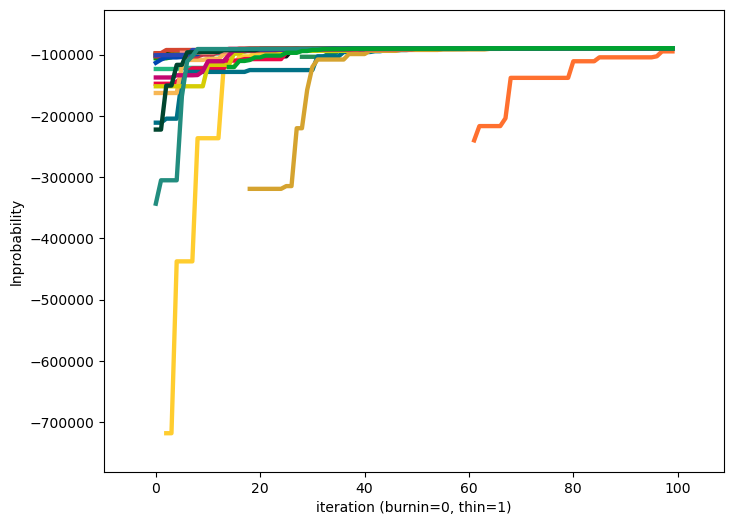

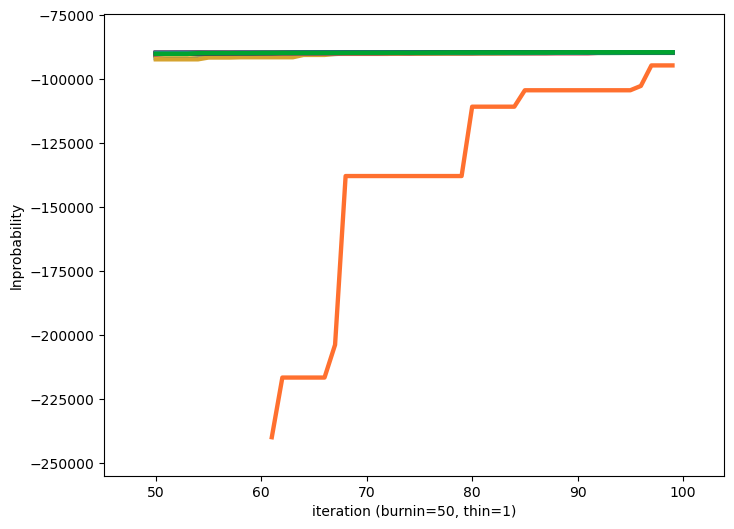

(<autofig.figure.Figure | 1 axes | 25 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [17]:
b.import_solution(fname="./external-jobs/aviles-invq/results/mcmc_iturbide_full", overwrite=True)
# b.solutions
b.plot(solution='mcmc_iturbide_full_solution', style='lnprobability', burnin=0, thin=1, show=True)
b.plot(solution='mcmc_iturbide_full_solution', style='lnprobability', burnin=50, thin=1, show=True)

(None, <Figure size 1600x1600 with 49 Axes>)

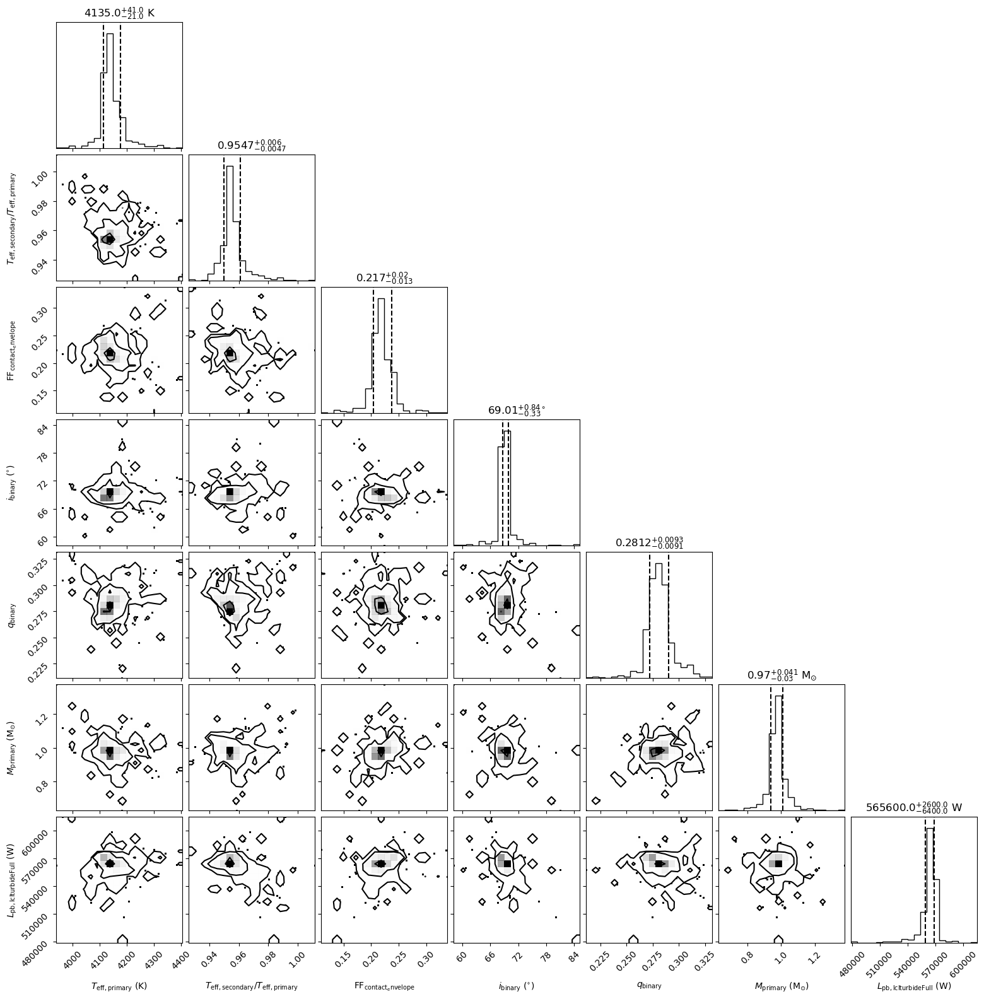

In [18]:
b.plot(solution='mcmc_iturbide_full_solution', style='corner', burnin=0, thin=1, show=True)

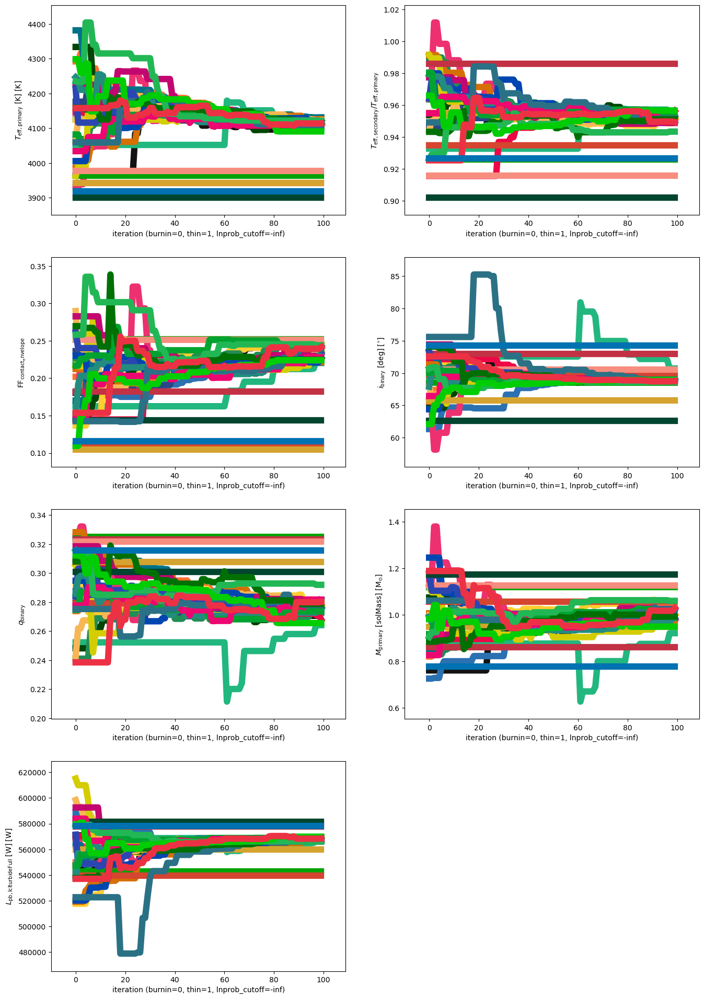

(<autofig.figure.Figure | 7 axes | 224 call(s)>,
 <Figure size 1600x2400 with 7 Axes>)

In [19]:
b.plot(solution='mcmc_iturbide_full_solution', style='trace', burnin=0, thin=1, show=True)

In [20]:
b['mcmc_iturbide_full_solution'].qualifiers

['wrap_central_values',
 'fitted_twigs',
 'fitted_units',
 'adopt_parameters',
 'adopt_distributions',
 'distributions_convert',
 'adopt_values',
 'niters',
 'nwalkers',
 'samples',
 'failed_samples',
 'lnprobabilities',
 'acceptance_fractions',
 'autocorr_times',
 'burnin',
 'thin',
 'nlags',
 'lnprob_cutoff',
 'progress',
 'comments',
 'imported_job']

Parameter: autocorr_times@mcmc_iturbide_full_solution@solution
                       Qualifier: autocorr_times
                     Description: measured autocorrelation time with shape (len(fitted_twigs)) before applying burnin/thin.  To access with a custom burnin/thin, see phoebe.helpers.get_emcee_object_from_solution
                           Value: [nan nan nan nan nan nan nan]
                  Constrained by: 
                      Constrains: None
                      Related to: None



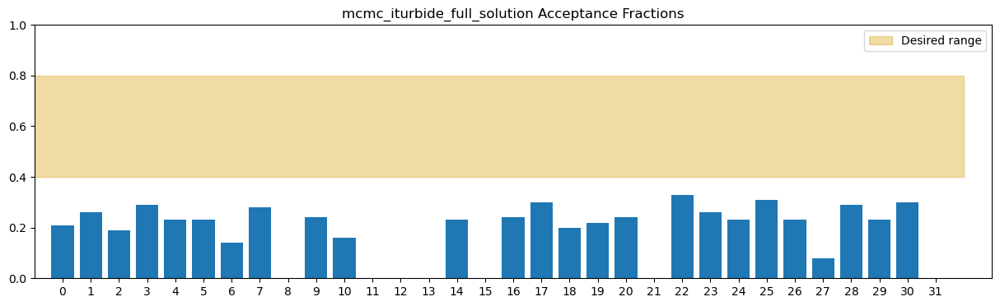

In [21]:
print(b['mcmc_iturbide_full_solution@autocorr_times'])

plotSamplerAcceptanceFractions(b, 'mcmc_iturbide_full_solution')

In [22]:
%%script echo "skipping; already ran"

# continue sampling from previous run to run a total of 800 iterations
continueSampler(b, "mcmc_iturbide_full", "mcmc_iturbide_full_round2", datasets=['lcIturbideFull'], subfolder="aviles-invq", niters=700)

skipping; already ran


## Gaia Sampling

In [44]:
b.distributions

['poro_porb_bounds',
 'bounds_around',
 'bounds_pblum_aviles_iturbide',
 'bounds_pblum_full_iturbide',
 'bounds_pblum_gaia_g',
 'bounds_pblum_ztf_g']

In [45]:
exportSampler(b, 'mcmc_gaia', subfolder='iturbide-gaia-ztf-relative_norm', datasets=gaiaDatasets,
			  init_from=['bounds_around', 'bounds_pblum_gaia_g'], nwalkers=32, niters=1000, progress_every_niters=10)
print(b['mcmc_gaia'])

mcmc_gaia | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_gaia.py | results/mcmc_gaia
ParameterSet: 15 parameters
        comments@mcmc_gaia@solver: 
      use_server@mcmc_gaia@solver: compute
         compute@mcmc_gaia@solver: phoebe01
   continue_from@mcmc_gaia@solver: None
       init_from@mcmc_gaia@solver: ['bounds_around', 'bounds_pblum_gaia_g']
   init_from_combine@mcmc_gaia...: first
   init_from_requires@mcmc_gai...: ['limits', 'priors']
          priors@mcmc_gaia@solver: []
        nwalkers@mcmc_gaia@solver: 32
          niters@mcmc_gaia@solver: 1000
   burnin_factor@mcmc_gaia@solver: 2.0
     thin_factor@mcmc_gaia@solver: 0.0
    nlags_factor@mcmc_gaia@solver: 3.0
   progress_every_niters@mcmc_...: 10
   expose_failed@mcmc_gaia@solver: True


In [25]:
b.import_solution(fname="./external-jobs/aviles-invq/results/mcmc_gaia", overwrite=True)

Thu, 16 Nov 2023 13:02 BUNDLE       WARNING not all uniqueids in fitted_uniqueids@mcmc_gaia_solution@solution are still valid.  Falling back on twigs.  Save and load same bundle to prevent this extra cost.


<ParameterSet: 23 parameters | qualifiers: fitted_uniqueids, adopt_distributions, thin, fitted_twigs, samples, lnprobabilities, imported_job, wrap_central_values, progress, adopt_values, distributions_bins, nwalkers, nlags, autocorr_times, burnin, comments, acceptance_fractions, fitted_units, niters, distributions_convert, failed_samples, adopt_parameters, lnprob_cutoff>

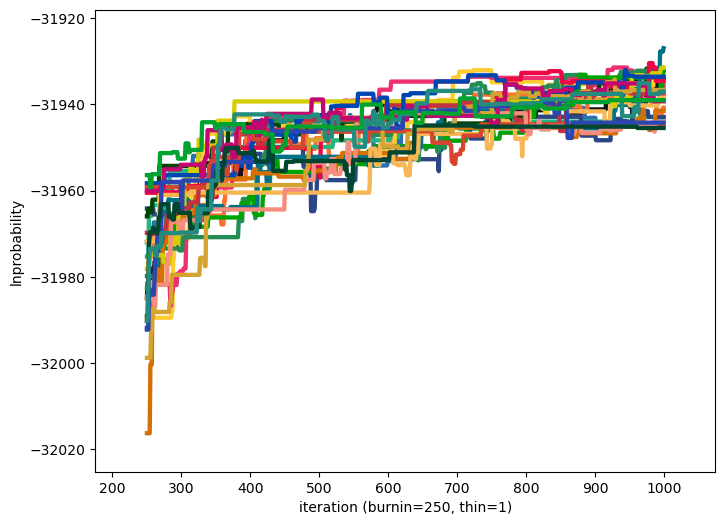

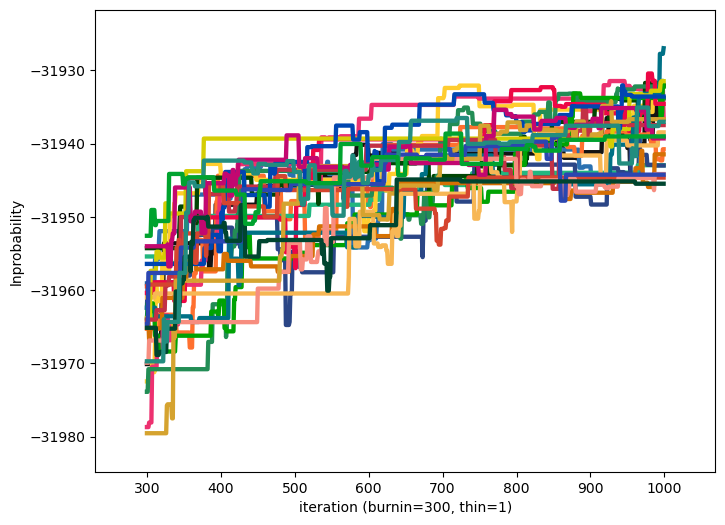

(<autofig.figure.Figure | 1 axes | 25 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [35]:
# b.plot(solution='mcmc_gaia_solution', style='lnprobability', burnin=0, thin=1, show=True)
# b.plot(solution='mcmc_gaia_solution', style='lnprobability', burnin=200, thin=1, show=True)
b.plot(solution='mcmc_gaia_solution', style='lnprobability', burnin=250, thin=1, show=True)

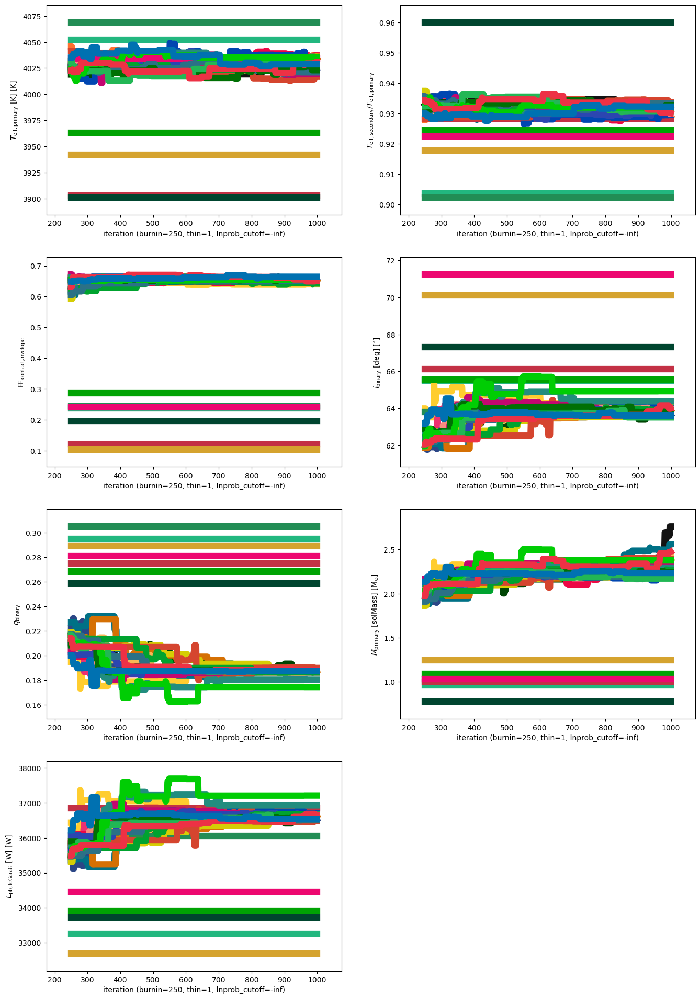

(<autofig.figure.Figure | 7 axes | 224 call(s)>,
 <Figure size 1600x2400 with 7 Axes>)

In [39]:
b.plot(solution='mcmc_gaia_solution', style='trace', burnin=250, thin=1, show=True)

In [27]:
print(b['pblum'])

ParameterSet: 6 parameters
   pblum@primary@lcIturbideAvi...: 959718.3862413258 W
   pblum@primary@lcIturbideFul...: 567161.6312684531 W
    pblum@primary@lcGaiaG@dataset: 34979.800770998816 W
   pblum@lcIturbideAviles@boun...: <distl.uniform_around width=100000.0 value=959718.3862413258 unit=W frac=False>
   pblum@lcIturbideFull@bounds...: <distl.uniform_around width=100000.0 value=567161.6312684531 unit=W frac=False>
   pblum@lcGaiaG@bounds_pblum_...: <distl.uniform_around width=5000.0 value=34979.800770998816 unit=W frac=False>


ParameterSet: 16 parameters
            incl@binary@component: 68.77716874302344 deg
   incl@bounds_around@distribu...: <distl.uniform_around width=15.0 value=68.77716874302344 unit=deg frac=False>
       teffratio@binary@component: 0.9493072392967905
   teffratio@bounds_around@dis...: <distl.uniform_around width=0.1 value=0.9493072392967905 unit= frac=False>
           teff@primary@component: 4138.4308834938365 K
   teff@poro_porb_bounds@distr...: <distl.uniform low=5663.112795884727 high=5826.126240382796 unit=K label=teff@primary label_latex=$T_{ \mathrm{ eff }, \mathrm{ primary } }$>
   teff@bounds_around@distribu...: <distl.uniform_around width=500.0 value=4138.4308834938365 unit=K frac=False>
           mass@primary@component: 1.0087816199638129 solMass
   mass@poro_porb_bounds@distr...: <distl.uniform low=1.0682593994618288 high=1.1762906068747014 unit=solMass label=mass@primary label_latex=$M_\mathrm{ primary }$>
   mass@bounds_around@distribu...: <distl.uniform_around width=0.

(None, <Figure size 1600x1600 with 49 Axes>)

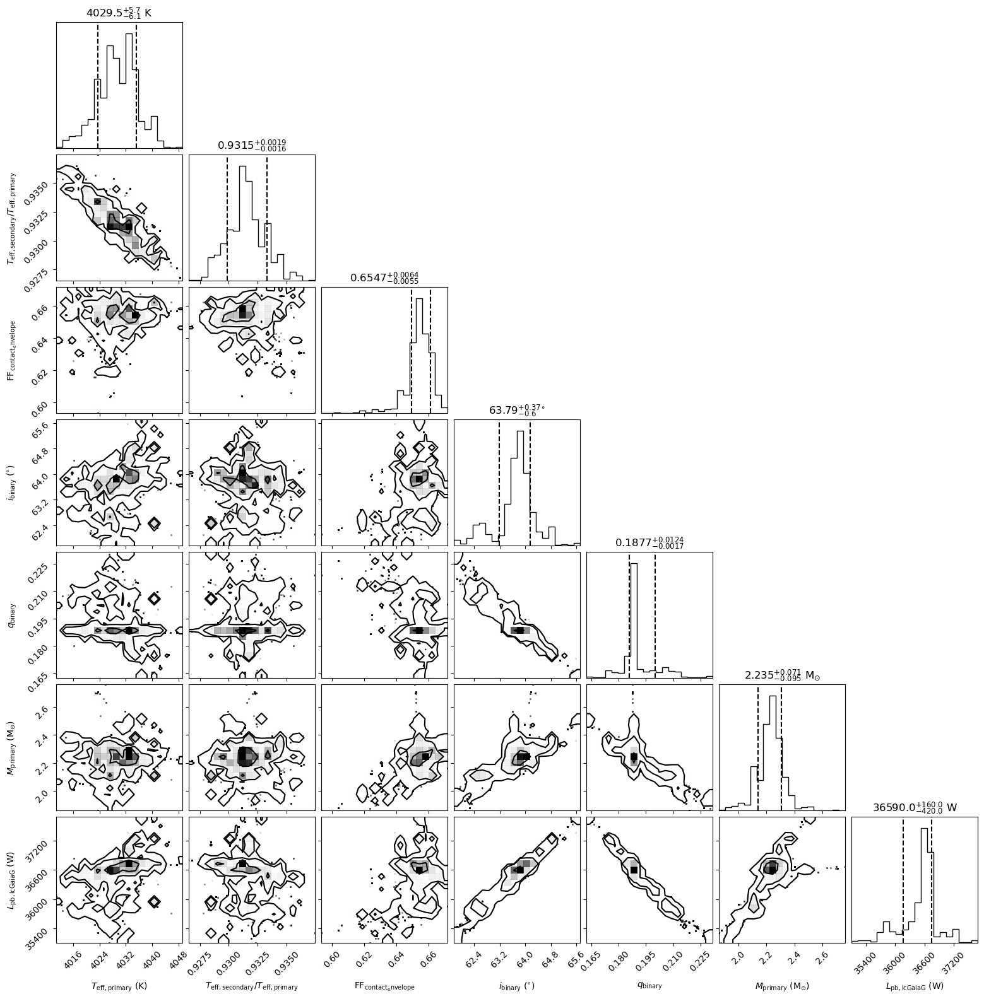

In [28]:
print(b.filter(['incl@binary', 'teffratio', 'teff@primary', 'mass@primary', 'fillout_factor', 'q', 'pblum@primary@lcGaiaG']))
b.plot(solution='mcmc_gaia_solution', style='corner', burnin=250, thin=1, show=True)

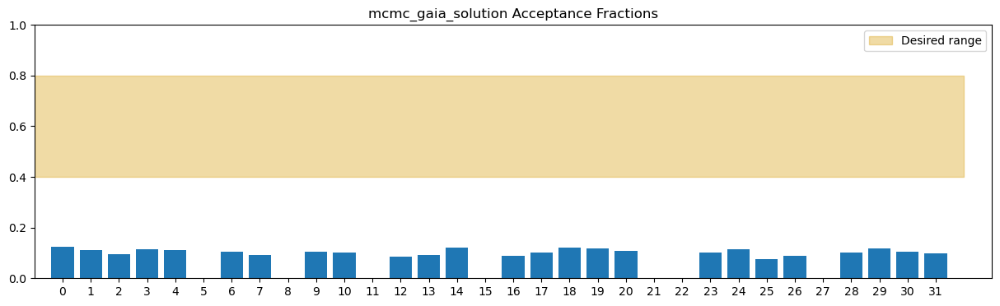

In [29]:
plotSamplerAcceptanceFractions(b, 'mcmc_gaia_solution')

In [30]:
b.solvers

['lcperiod_iturbide_auto',
 'lcperiod_iturbide_manual',
 'ebai_knn',
 'ebai_knn_lc_iturbide',
 'ebai_knn_lc_gaia_g',
 'ebai_knn_lc_gaia_rp',
 'ebai_knn_lc_gaia_bp',
 'ebai_knn_gaia',
 'ebai_knn_lc_iturbide_raw',
 'ebai_knn_lc_gaia_g_raw',
 'ebai_knn_lc_gaia_rp_raw',
 'ebai_knn_lc_gaia_bp_raw',
 'ebai_knn_raw',
 'ebai_knn_raw_gaia',
 'opt_teffr_ff',
 'opt_init_pbgaia',
 'opt_tprim_tratio_pbgaia',
 'opt_pb_iturbide_aviles',
 'opt_pb_iturbide_full',
 'opt_period_t0',
 'opt_q',
 'opt_q_incl',
 'opt_incl',
 'mcmc_iturbide_full',
 'mcmc_gaia']

In [31]:
# TODO: run once DE optimizer on server finishes
continueSampler(b, prev_solver='mcmc_gaia', continuation_label="mcmc_gaia_round2", datasets=gaiaDatasets, subfolder="aviles-invq", niters=1500)

mcmc_gaia | external-jobs/aviles-invq/mcmc_gaia_round2.py | results/mcmc_gaia_round2_solution


### Modifying the MCMC sampler

Previously using 32 walkers to explore parameter space; some of the walkers didn't budge from their initial positions for certain parameters. Thinking
this might be due to using 2x walkers than there are CPUs in the server (8c-16t CPU). Adopting distributions and re-running with only 16 walkers.

In [42]:
b.adopt_solution(solution='mcmc_gaia_solution', adopt_distributions=True, distribution='mcmc_gaia_dist')

<ParameterSet: 14 parameters | contexts: distribution, dataset, component>

In [45]:
print(b['teff']) # confirmed that distribution is present in "mcmc_gaia_dist"

ParameterSet: 6 parameters
           teff@primary@component: 4029.9091072942847 K
C        teff@secondary@component: 3755.810839232623 K
                  teff@constraint: {teffratio@binary@component} * {teff@primary@component}
   teff@poro_porb_bounds@distr...: <distl.uniform low=5663.112795884727 high=5826.126240382796 unit=K label=teff@primary label_latex=$T_{ \mathrm{ eff }, \mathrm{ primary } }$>
   teff@bounds_around@distribu...: <distl.uniform_around width=500.0 value=4029.9091072942847 unit=K frac=False>
   teff@mcmc_gaia_dist@distrib...: <distl.mvsamplesslice dimension=0 samples=[[4.02702668e+03 1.03507423e+00 1.33341214e-01 ... 3.80830193e-01
  1.01924541e+00 3.20191592e+04]
 [4.20380409e+03 9.76833471e-01 2.11559746e-01 ... 3.00799387e-01
  8.57157218e-01 3.57262313e+04]
 [4.13849110e+03 9.63674154e-01 1.50081865e-01 ... 3.05682594e-01
  9.76147972e-01 3.52706338e+04]
 ...
 [4.03117227e+03 9.30758522e-01 6.55215138e-01 ... 1.85371074e-01
  2.30387625e+00 3.67282170e+04]
 [4

In [46]:
exportSampler(b, 'mcmc_gaia16', subfolder='aviles-invq', datasets=gaiaDatasets,
			  init_from=['mcmc_gaia_dist', 'bounds_around', 'bounds_pblum_gaia_g'], nwalkers=16, niters=1000, progress_every_niters=10, priors_combine='or')

Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on teff@primary@star@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on teffratio@binary@orbit@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on fillout_factor@contact_envelope@envelope@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on incl@binary@orbit@component with distribution='bounds_around' as distribution existed on an earlier distribution which takes precedence.
Thu, 16 Nov 2023 16:37 BUNDLE       WARNING ignoring distribution on q@binary@orbit@component with distribution='bounds_around' as distribution exis

mcmc_gaia16 | external-jobs/aviles-invq/mcmc_gaia16.py | results/mcmc_gaia16


In [47]:
print(b['period'])

ParameterSet: 7 parameters
C        period@primary@component: 0.33354138280951534 d
C      period@secondary@component: 0.33354138280951534 d
          period@binary@component: 0.33354138280951534 d
        period@primary@constraint: {period@binary@component} / {syncpar@primary@component}
      period@secondary@constraint: {period@binary@component} / {syncpar@secondary@component}
R  period@lcperiod_iturbide_au...: [0.00132994
 0.00136319
 0.00139644
 ...
 0.49666701
 0.49670026
 0.49673351] d
R  period@lcperiod_iturbide_ma...: [7.99991321e+00
 7.99982642e+00
 7.99973963e+00
 ...
 1.17358188e-03
 1.08679094e-03
 1.00000000e-03] d


## ZTF Sampling

In [91]:
exportSampler(b, sampler_solver='mcmc_ztf', subfolder='iturbide-gaia-ztf-relative_norm', datasets=ztfDatasets,
			  init_from=['bounds_around', 'bounds_pblum_ztf_g'], nwalkers=32, niters=1000, progress_every_niters=10)
print(b['mcmc_ztf'])

mcmc_ztf | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_ztf.py | results/mcmc_ztf
ParameterSet: 15 parameters
         comments@mcmc_ztf@solver: 
       use_server@mcmc_ztf@solver: compute
          compute@mcmc_ztf@solver: phoebe01
    continue_from@mcmc_ztf@solver: None
        init_from@mcmc_ztf@solver: ['bounds_around', 'bounds_pblum_ztf_g']
   init_from_combine@mcmc_ztf@...: first
   init_from_requires@mcmc_ztf...: ['limits', 'priors']
           priors@mcmc_ztf@solver: []
         nwalkers@mcmc_ztf@solver: 32
           niters@mcmc_ztf@solver: 1000
    burnin_factor@mcmc_ztf@solver: 2.0
      thin_factor@mcmc_ztf@solver: 0.0
     nlags_factor@mcmc_ztf@solver: 3.0
   progress_every_niters@mcmc_...: 10
    expose_failed@mcmc_ztf@solver: True


In [81]:
print(b['enabled'])

ParameterSet: 10 parameters
   enabled@mesh01@phoebe01@com...: True
   enabled@lcZtfG@phoebe01@com...: True
   enabled@lcZtfR@phoebe01@com...: True
   enabled@lcIturbideAviles@ph...: True
   enabled@lcIturbideFull@phoe...: True
   enabled@lcGaiaG@phoebe01@co...: True
   enabled@lcGaiaRP@phoebe01@c...: True
   enabled@lcGaiaBP@phoebe01@c...: True
   enabled@lcZtfGTrimmed@phoeb...: True
   enabled@lcZtfRTrimmed@phoeb...: True


In [82]:
print(b['pblum_mode'])

ParameterSet: 9 parameters
        pblum_mode@lcZtfG@dataset: component-coupled
        pblum_mode@lcZtfR@dataset: dataset-coupled
   pblum_mode@lcIturbideAviles...: component-coupled
   pblum_mode@lcIturbideFull@d...: component-coupled
       pblum_mode@lcGaiaG@dataset: component-coupled
      pblum_mode@lcGaiaRP@dataset: dataset-coupled
      pblum_mode@lcGaiaBP@dataset: dataset-coupled
   pblum_mode@lcZtfGTrimmed@da...: component-coupled
   pblum_mode@lcZtfRTrimmed@da...: component-coupled


In [86]:
print(b['lcZtfR'])

ParameterSet: 28 parameters
             times@lcZtfR@dataset: [2458255.96452662 2458258.95440244 2458266.88328585
 ... 2460123.95421299 2460125.94562702
 2460127.90781442] d
            fluxes@lcZtfR@dataset: [1.58021769 1.74090984 1.90564044 ... 1.38218826
 1.39289879 1.78978853] W / m2
          passband@lcZtfR@dataset: ZTF:r
   intens_weighting@lcZtfR@dat...: energy
     compute_times@lcZtfR@dataset: [] d
C   compute_phases@lcZtfR@dataset: []
         phases_t0@lcZtfR@dataset: t0_supconj
      mask_enabled@lcZtfR@dataset: True
       mask_phases@lcZtfR@dataset: []
      solver_times@lcZtfR@dataset: auto
            sigmas@lcZtfR@dataset: [0.02215915 0.02354319 0.02496239 ... 0.02045381
 0.02054605 0.02396425] W / m2
        sigmas_lnf@lcZtfR@dataset: -inf
        pblum_mode@lcZtfR@dataset: dataset-coupled
     pblum_dataset@lcZtfR@dataset: lcZtfG
           l3_mode@lcZtfR@dataset: flux
                l3@lcZtfR@dataset: 0.0 W / m2
           exptime@lcZtfR@dataset: 0.0 s
   ld_mode

### Trimmed Datasets

Utilizing every other data point in ZTF light curves to reduce the number of data points needed to evaluate. For running a forward model, this effectively cuts down the compute time in half, which should provide a much needed speed boost to MCMC sampling (for full light curve, PHOEBE estimates over a month of compute time needed for 1000 iterations).

Subsequent sampling may be done using the full light curve, but initial results using trimmed datasets *should* be valid and applicable to full light curve data.

100%|██████████| 1731/1731 [04:07<00:00,  7.00it/s]


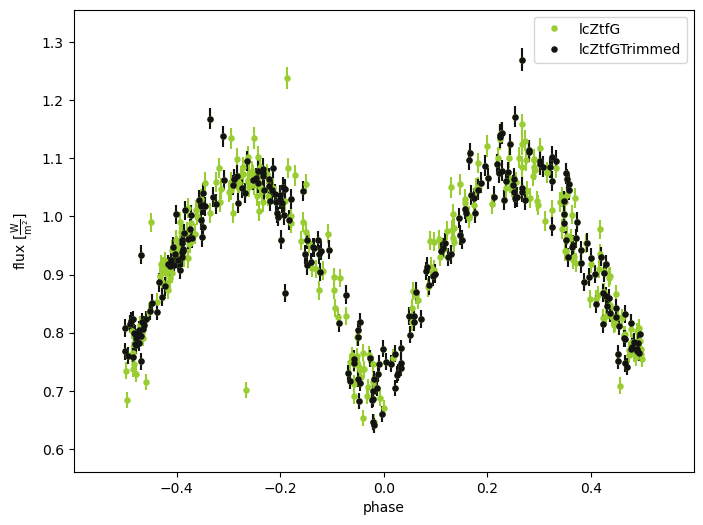

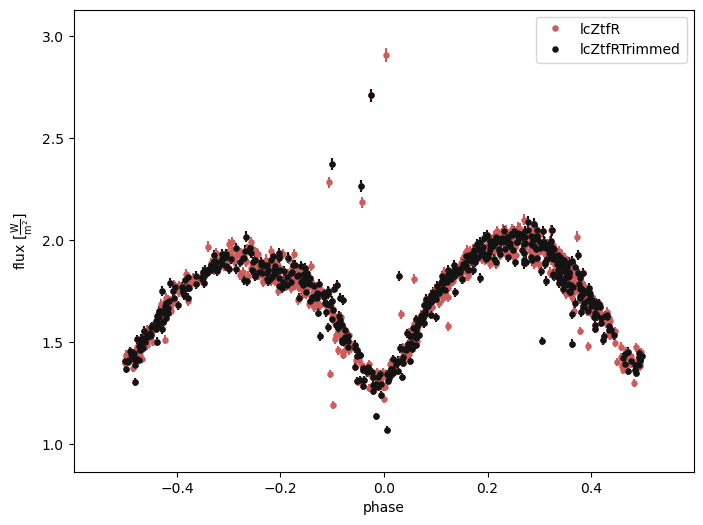

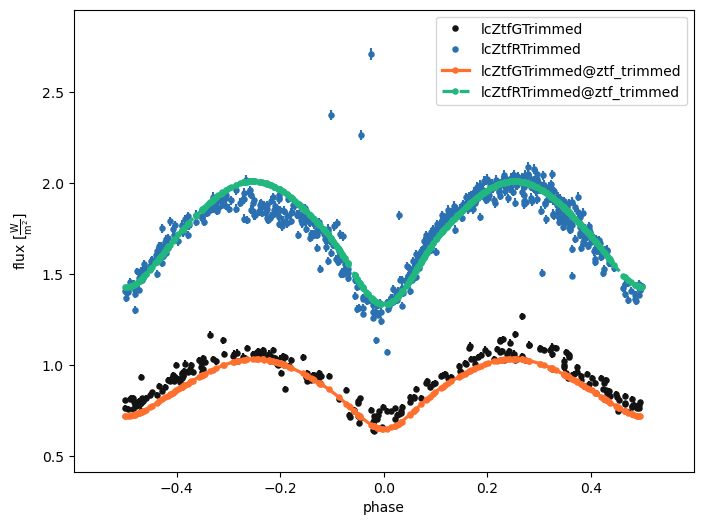

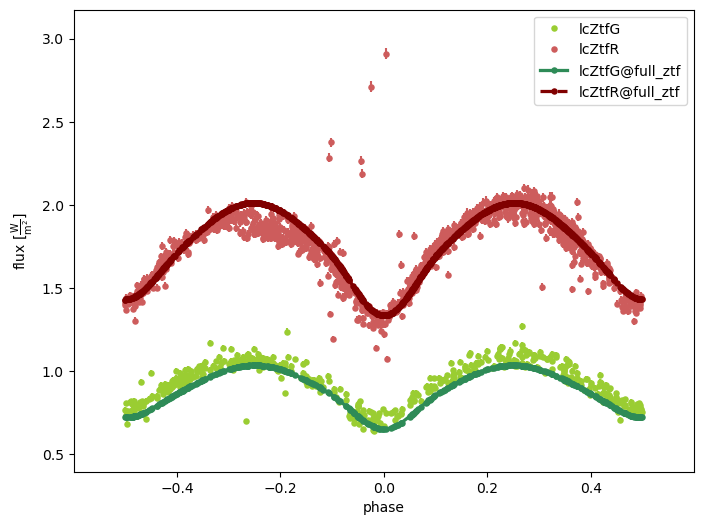

(<autofig.figure.Figure | 1 axes | 4 call(s)>,
 <Figure size 800x600 with 1 Axes>)

In [89]:
b.add_dataset('lc', dataset='lcZtfGTrimmed', overwrite=True, passband='ZTF:g',
			  times=b.get_value(qualifier='times', dataset='lcZtfG', context='dataset')[::2],
			  fluxes=b.get_value(qualifier='fluxes', dataset='lcZtfG', context='dataset')[::2],
			  sigmas=b.get_value(qualifier='sigmas', dataset='lcZtfG', context='dataset')[::2],
			  pblum=b.get_quantity(qualifier='pblum', dataset='lcZtfG', context='dataset'))

b.add_dataset('lc', dataset='lcZtfRTrimmed', overwrite=True, passband='ZTF:r',
			  times=b.get_value(qualifier='times', dataset='lcZtfR', context='dataset')[::2],
			  fluxes=b.get_value(qualifier='fluxes', dataset='lcZtfR', context='dataset')[::2],
			  sigmas=b.get_value(qualifier='sigmas', dataset='lcZtfR', context='dataset')[::2],
			  pblum_mode='dataset-coupled', pblum_dataset='lcZtfGTrimmed')

trimmedZtfDatasets = ['lcZtfGTrimmed', 'lcZtfRTrimmed']

gen_utils.abilitateDatasets(b, ['lcZtfGTrimmed', 'lcZtfRTrimmed'])
b.run_compute(model='ztf_trimmed', overwrite=True)

gen_utils.abilitateDatasets(b, ztfDatasets)
b.run_compute(model='full_ztf', overwrite=True)

b.plot(x='phase', dataset=['lcZtfG', 'lcZtfGTrimmed'], context='dataset', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfR', 'lcZtfRTrimmed'], context='dataset', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfRTrimmed', 'lcZtfGTrimmed'], model='ztf_trimmed', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)
b.plot(x='phase', dataset=['lcZtfR', 'lcZtfG'], model='full_ztf', legend=True, show=True, marker='.', color=gen_utils.ZTF_PLOT_COLORS, s=0.015)

In [92]:
b.distributions

['poro_porb_bounds',
 'bounds_around',
 'bounds_pblum_aviles_iturbide',
 'bounds_pblum_full_iturbide',
 'bounds_pblum_gaia_g',
 'bounds_pblum_ztf_g']

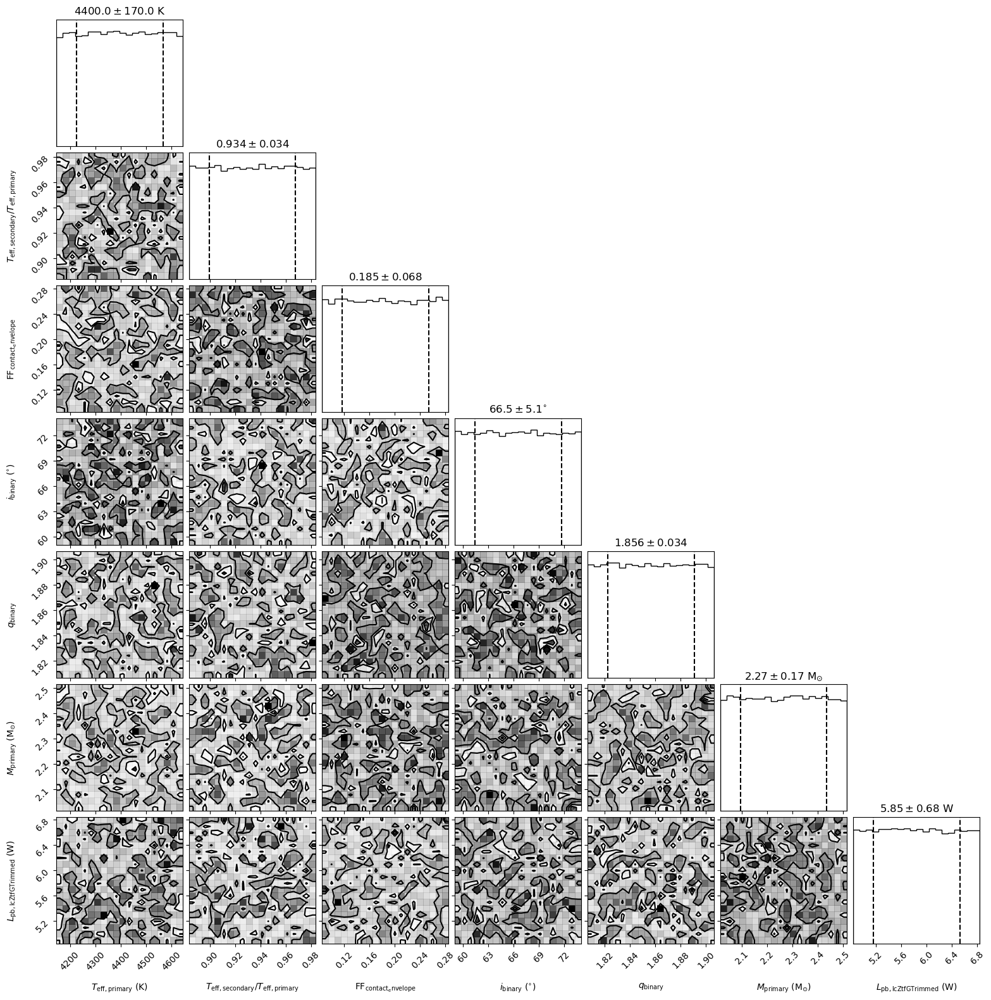

In [93]:
b.add_distribution({
	'pblum@primary@lcZtfGTrimmed': phoebe.uniform_around(2)
}, distribution='bounds_pblum_ztf_g_trimmed', overwrite_all=True)

_ = b.plot_distribution_collection(distribution=['bounds_around', 'bounds_pblum_ztf_g_trimmed'], show=True)

In [94]:
exportSampler(b, sampler_solver='mcmc_ztf_trimmed', subfolder='iturbide-gaia-ztf-relative_norm', datasets=trimmedZtfDatasets,
			  init_from=['bounds_around', 'bounds_pblum_ztf_g_trimmed'], nwalkers=32, niters=1000, progress_every_niters=10)
print(b['mcmc_ztf_trimmed'])

mcmc_ztf_trimmed | external-jobs/iturbide-gaia-ztf-relative_norm/mcmc_ztf_trimmed.py | results/mcmc_ztf_trimmed
ParameterSet: 15 parameters
   comments@mcmc_ztf_trimmed@s...: 
   use_server@mcmc_ztf_trimmed...: compute
   compute@mcmc_ztf_trimmed@so...: phoebe01
   continue_from@mcmc_ztf_trim...: None
   init_from@mcmc_ztf_trimmed@...: ['bounds_around', 'bounds_pblum_ztf_g_trimmed']
   init_from_combine@mcmc_ztf_...: first
   init_from_requires@mcmc_ztf...: ['limits', 'priors']
   priors@mcmc_ztf_trimmed@solver: []
   nwalkers@mcmc_ztf_trimmed@s...: 32
   niters@mcmc_ztf_trimmed@solver: 1000
   burnin_factor@mcmc_ztf_trim...: 2.0
   thin_factor@mcmc_ztf_trimme...: 0.0
   nlags_factor@mcmc_ztf_trimm...: 3.0
   progress_every_niters@mcmc_...: 10
   expose_failed@mcmc_ztf_trim...: True
